In [1]:
import pandas as pd
import seaborn as sns
import numpy as np

import math
import logging
import matplotlib.pyplot as plt
import sklearn as sk

# Data Importation

In [2]:
#ds = pd.read_excel('trainDataset.xls')
ds = pd.read_csv('trainDataset.csv')

In [3]:
# View the dataset
ds.head()

,ID,pCR (outcome),RelapseFreeSurvival (outcome),Age,ER,PgR,HER2,TrippleNegative,ChemoGrade,Proliferation,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
0,TRG002174,1,144.0,41.0,0,0,0,1,3,3,...,0.517172,0.375126,3.325332,0.002314,3880771.500,473.464852,0.000768,0.182615,0.030508,0.000758
1,TRG002178,0,142.0,39.0,1,1,0,0,3,3,...,0.444391,0.444391,3.032144,0.005612,2372009.744,59.459710,0.004383,0.032012,0.001006,0.003685
2,TRG002204,1,135.0,31.0,0,0,0,1,2,1,...,0.534549,0.534549,2.485848,0.006752,1540027.421,33.935384,0.007584,0.024062,0.000529,0.006447
3,TRG002206,0,12.0,35.0,0,0,0,1,3,3,...,0.506185,0.506185,2.606255,0.003755,6936740.794,46.859265,0.005424,0.013707,0.000178,0.004543
4,TRG002210,0,109.0,61.0,1,0,0,0,2,1,...,0.462282,0.462282,2.809279,0.006521,1265399.054,39.621023,0.006585,0.034148,0.001083,0.005626


# Data Preprocessing

In [4]:
'''
Since this is a regression task we can
safely remove an instaces of classification data:

PCR
ER
PgH
HeR2
TrippleNegative
ChemoGrade
Proliferation
HistologyType
LNStatus
TumourStage
'''

def dropRegression(df, colNames):
    
    df.drop(colNames, axis=1, inplace=True)
    return df    

In [5]:
# remove null cases (999) from the data set
ds= ds[~(ds == 999).any(axis=1)]
ds.shape

(390, 120)

In [6]:
ds.reset_index()

,index,ID,pCR (outcome),RelapseFreeSurvival (outcome),Age,ER,PgR,HER2,TrippleNegative,ChemoGrade,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
0,0,TRG002174,1,144.000000,41.0,0,0,0,1,3,...,0.517172,0.375126,3.325332,0.002314,3.880772e+06,473.464852,0.000768,0.182615,0.030508,0.000758
1,1,TRG002178,0,142.000000,39.0,1,1,0,0,3,...,0.444391,0.444391,3.032144,0.005612,2.372010e+06,59.459710,0.004383,0.032012,0.001006,0.003685
2,2,TRG002204,1,135.000000,31.0,0,0,0,1,2,...,0.534549,0.534549,2.485848,0.006752,1.540027e+06,33.935384,0.007584,0.024062,0.000529,0.006447
3,3,TRG002206,0,12.000000,35.0,0,0,0,1,3,...,0.506185,0.506185,2.606255,0.003755,6.936741e+06,46.859265,0.005424,0.013707,0.000178,0.004543
4,4,TRG002210,0,109.000000,61.0,1,0,0,0,2,...,0.462282,0.462282,2.809279,0.006521,1.265399e+06,39.621023,0.006585,0.034148,0.001083,0.005626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,395,TRG002955,1,49.250000,46.1,0,0,0,1,3,...,0.439568,0.439568,3.056046,0.001339,1.671271e+07,79.989003,0.003282,0.024716,0.000812,0.003078
386,396,TRG002958,0,48.500000,53.3,0,0,0,1,2,...,0.527779,0.527778,1.500000,0.003728,2.132007e+05,0.996746,0.252582,0.007380,0.000037,0.231059
387,397,TRG002961,0,47.500000,68.8,1,0,0,0,3,...,0.313693,0.313693,3.573557,0.001112,2.008034e+07,204.864200,0.001372,0.054063,0.003697,0.001368
388,398,TRG002962,0,46.916667,46.0,1,0,0,0,2,...,0.670229,0.670229,1.857045,0.006706,5.609262e+05,9.609163,0.026591,0.018682,0.000311,0.022676


In [7]:
# Drop Id and PCR (since this is the regression task)
"""
'ER',
'PgR',
'HER2',
'TrippleNegative',
'ChemoGrade',
'Proliferation',
'HistologyType',
'LNStatus',
'TumourStage',
"""

y = ds["RelapseFreeSurvival (outcome)"]
X = ds

In [8]:
X.shape
y.shape

(390,)

"""
IMPORTANT
On the dataframe Triple negative shows a linear combination of the three binary sets HER2, PGR and ER
This could be used to reduce the number of features in the dataset, DR and FS
"""

In [9]:
X

,ID,pCR (outcome),RelapseFreeSurvival (outcome),Age,ER,PgR,HER2,TrippleNegative,ChemoGrade,Proliferation,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
0,TRG002174,1,144.000000,41.0,0,0,0,1,3,3,...,0.517172,0.375126,3.325332,0.002314,3.880772e+06,473.464852,0.000768,0.182615,0.030508,0.000758
1,TRG002178,0,142.000000,39.0,1,1,0,0,3,3,...,0.444391,0.444391,3.032144,0.005612,2.372010e+06,59.459710,0.004383,0.032012,0.001006,0.003685
2,TRG002204,1,135.000000,31.0,0,0,0,1,2,1,...,0.534549,0.534549,2.485848,0.006752,1.540027e+06,33.935384,0.007584,0.024062,0.000529,0.006447
3,TRG002206,0,12.000000,35.0,0,0,0,1,3,3,...,0.506185,0.506185,2.606255,0.003755,6.936741e+06,46.859265,0.005424,0.013707,0.000178,0.004543
4,TRG002210,0,109.000000,61.0,1,0,0,0,2,1,...,0.462282,0.462282,2.809279,0.006521,1.265399e+06,39.621023,0.006585,0.034148,0.001083,0.005626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,TRG002955,1,49.250000,46.1,0,0,0,1,3,3,...,0.439568,0.439568,3.056046,0.001339,1.671271e+07,79.989003,0.003282,0.024716,0.000812,0.003078
396,TRG002958,0,48.500000,53.3,0,0,0,1,2,1,...,0.527779,0.527778,1.500000,0.003728,2.132007e+05,0.996746,0.252582,0.007380,0.000037,0.231059
397,TRG002961,0,47.500000,68.8,1,0,0,0,3,3,...,0.313693,0.313693,3.573557,0.001112,2.008034e+07,204.864200,0.001372,0.054063,0.003697,0.001368
398,TRG002962,0,46.916667,46.0,1,0,0,0,2,1,...,0.670229,0.670229,1.857045,0.006706,5.609262e+05,9.609163,0.026591,0.018682,0.000311,0.022676


### Feature Encoding 

In [10]:
# This process will be converting categorical values into numerical format
# There may be a lot of information regarding the categorical data that may help with the regression
# TripleNegative is a binary combination of ER, PgR and HER2 we can get rid of them

cat_names = ["ER", "PgR", "HER2"]
X.drop(cat_names, axis=1, inplace=True)

In [11]:
# Can get rid of ReplaseFreeSurvival since that is what we are determining
X.drop("RelapseFreeSurvival (outcome)", axis=1, inplace=True)

In [12]:
# Get rid of ID since that has no relevance in the dataset
X.drop("ID", axis=1, inplace=True)

In [13]:
# Seen that there are decimal points within the age feature
# Round Age from float to nearest float
X['Age'] = X['Age'].round()

In [14]:
# Now change all the float types to integers
X['Age'] = X['Age'].astype(int)

In [15]:
# PCR - 0,1
# Tripple Negative - 0,1
# ChemoGrade - only 2 instances of 1 so we can negate that and get rid of it - 2,3
# Proliferation - 1,2,3
# HistologyType - 1,2
# LNStatus - 0,1
# TumourStage - 1,2,3,4

# Don't need to use feature encoding as they are already encoded
# But we need to change the 1 values, so replace them with the mode of the data
# Mode is 2 so we replace the 1s with 2s
X["ChemoGrade"] = X["ChemoGrade"].replace(1,2)

In [16]:
X["ChemoGrade"].value_counts()

2    232
3    158
Name: ChemoGrade, dtype: int64

In [17]:
X

,pCR (outcome),Age,TrippleNegative,ChemoGrade,Proliferation,HistologyType,LNStatus,TumourStage,original_shape_Elongation,original_shape_Flatness,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
0,1,41,1,3,3,1,1,2,0.813912,0.724080,...,0.517172,0.375126,3.325332,0.002314,3.880772e+06,473.464852,0.000768,0.182615,0.030508,0.000758
1,0,39,0,3,3,1,1,2,0.666118,0.476173,...,0.444391,0.444391,3.032144,0.005612,2.372010e+06,59.459710,0.004383,0.032012,0.001006,0.003685
2,1,31,1,2,1,1,0,2,0.645083,0.594470,...,0.534549,0.534549,2.485848,0.006752,1.540027e+06,33.935384,0.007584,0.024062,0.000529,0.006447
3,0,35,1,3,3,1,1,3,0.770842,0.501228,...,0.506185,0.506185,2.606255,0.003755,6.936741e+06,46.859265,0.005424,0.013707,0.000178,0.004543
4,0,61,0,2,1,1,0,2,0.861035,0.750267,...,0.462282,0.462282,2.809279,0.006521,1.265399e+06,39.621023,0.006585,0.034148,0.001083,0.005626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,1,46,1,3,3,1,1,4,0.760008,0.427937,...,0.439568,0.439568,3.056046,0.001339,1.671271e+07,79.989003,0.003282,0.024716,0.000812,0.003078
396,0,53,1,2,1,1,0,2,0.657236,0.447210,...,0.527779,0.527778,1.500000,0.003728,2.132007e+05,0.996746,0.252582,0.007380,0.000037,0.231059
397,0,69,0,3,3,1,1,3,0.890276,0.837452,...,0.313693,0.313693,3.573557,0.001112,2.008034e+07,204.864200,0.001372,0.054063,0.003697,0.001368
398,0,46,0,2,1,1,1,2,0.464971,0.396526,...,0.670229,0.670229,1.857045,0.006706,5.609262e+05,9.609163,0.026591,0.018682,0.000311,0.022676


In [18]:
y

0      144.000000
1      142.000000
2      135.000000
3       12.000000
4      109.000000
          ...    
395     49.250000
396     48.500000
397     47.500000
398     46.916667
399     46.750000
Name: RelapseFreeSurvival (outcome), Length: 390, dtype: float64

# Data Visualisation (before FS)

## Boxplots (visualise outliers in continuous variables)

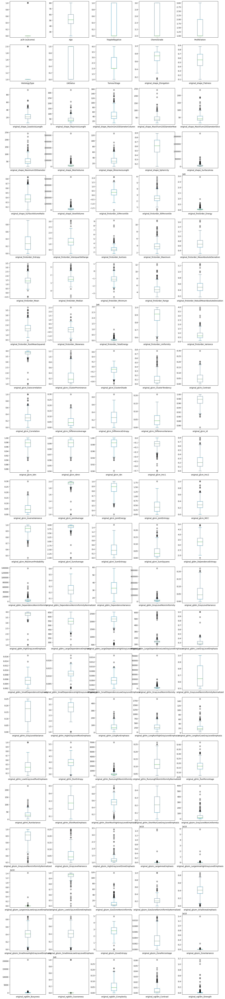

In [19]:
#graphs to see outliers and the spread of each of the features
data_mean = ds.iloc[:, :]
data_mean.plot(kind='box', subplots=True, layout=(24,5), sharex=False, sharey=False, fontsize=10, figsize=(20,100));

In [20]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

Xs = scaler.fit_transform(X)

fig,ax=plt.subplots(1,figsize=(100,70))
fig.tight_layout()
sns.boxplot(data=Xs,ax=ax)

## Heatmap

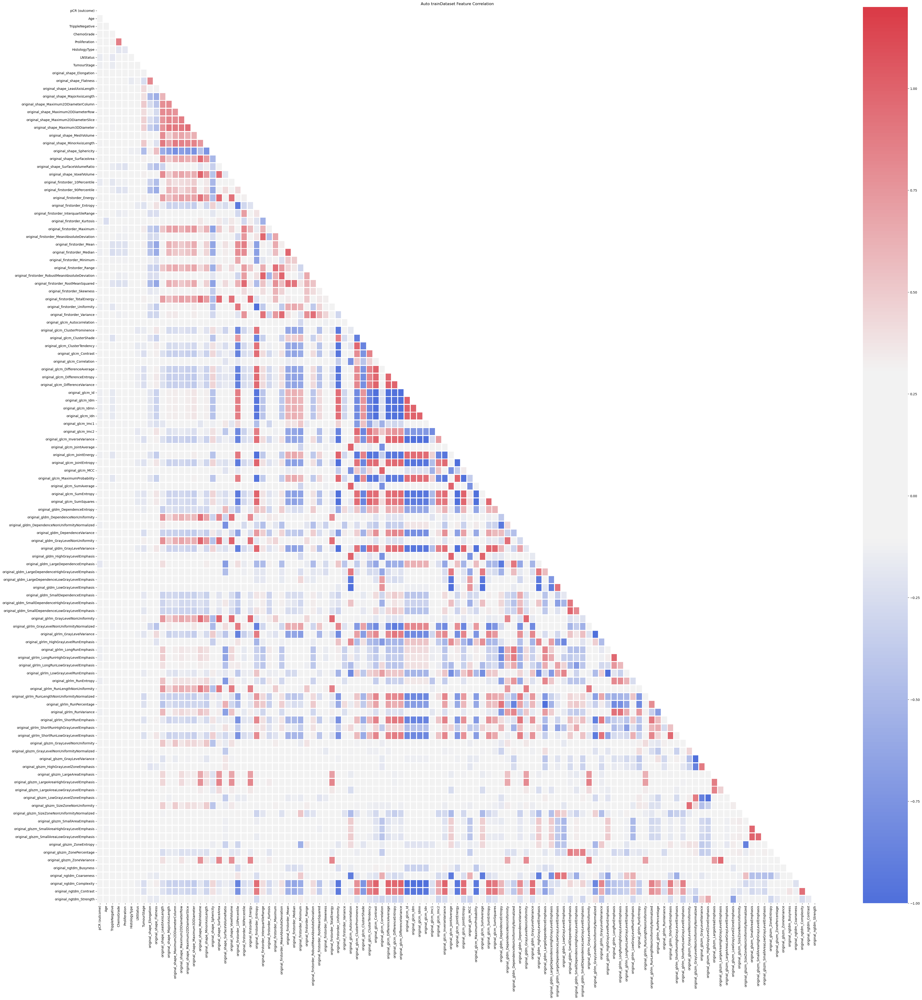

In [21]:
#graph showing the correlation between features to try to determine links between features
#to remove most of the noise as it is a large graph, only showing values with correlation over a certain threshold
#this threshold is determined and can be changed by the sensitivity variable

corrMatt = ds.corr()
# Generate a mask for the upper triangle
mask = np.zeros_like(corrMatt)
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(50, 50))
plt.title('Auto trainDataset Feature Correlation')
# Generate a custom diverging colormap
sensitivity = 76
cmap = sns.diverging_palette(260, 10, sep=201-2*sensitivity, as_cmap=True)
#cmap = sns.diverging_palette(260, 10, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corrMatt, vmax=1.2, square=False, cmap=cmap, mask=mask, ax=ax, annot=False, fmt='.2g', linewidths=2);

In [22]:
# Show the table of relevant correlations 
correlation = X.corr()
correlation

,pCR (outcome),Age,TrippleNegative,ChemoGrade,Proliferation,HistologyType,LNStatus,TumourStage,original_shape_Elongation,original_shape_Flatness,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
pCR (outcome),1.000000,-0.006675,0.088018,0.096693,0.148456,-0.073315,-0.152218,-0.131466,0.023344,0.064937,...,-0.015173,-0.005820,-0.048741,0.008877,-0.035642,0.097049,-0.037850,0.135759,0.121864,-0.068247
Age,-0.006675,1.000000,-0.073328,-0.034260,-0.036154,0.173815,0.124113,0.046565,-0.051564,-0.007781,...,-0.122711,-0.103160,-0.105511,0.001016,-0.085819,-0.012723,0.088416,0.077369,0.080297,-0.047216
TrippleNegative,0.088018,-0.073328,1.000000,0.285732,0.308830,-0.081303,-0.183401,-0.154197,0.146132,0.216121,...,0.029688,0.025550,-0.020748,-0.060689,0.069031,-0.017677,-0.100189,0.170402,0.186163,-0.039020
ChemoGrade,0.096693,-0.034260,0.285732,1.000000,0.859940,-0.199321,-0.029643,-0.006951,0.115696,0.194140,...,0.033198,0.023462,0.076574,-0.088188,0.069276,-0.034109,-0.095051,0.093969,0.092990,0.044480
Proliferation,0.148456,-0.036154,0.308830,0.859940,1.000000,-0.183465,-0.067334,-0.028066,0.089654,0.188659,...,0.061956,0.051284,0.052014,-0.091301,0.039426,-0.029605,-0.085431,0.078918,0.082295,0.025232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
original_ngtdm_Busyness,0.097049,-0.012723,-0.017677,-0.034109,-0.029605,-0.024876,-0.057273,-0.009216,0.031192,0.053987,...,-0.111294,-0.117106,-0.003901,-0.076234,-0.006831,1.000000,-0.031604,0.301513,0.375399,-0.040855
original_ngtdm_Coarseness,-0.037850,0.088416,-0.100189,-0.095051,-0.085431,-0.034201,0.064797,0.021489,-0.145663,-0.172940,...,-0.434495,-0.442761,-0.460314,-0.216542,-0.006126,-0.031604,1.000000,-0.221837,-0.131320,-0.047309
original_ngtdm_Complexity,0.135759,0.077369,0.170402,0.093969,0.078918,-0.037213,-0.133355,-0.246692,0.196077,0.332786,...,-0.171404,-0.220677,0.217067,0.061594,-0.084872,0.301513,-0.221837,1.000000,0.940338,-0.257421
original_ngtdm_Contrast,0.121864,0.080297,0.186163,0.092990,0.082295,-0.052304,-0.117925,-0.225100,0.151048,0.278720,...,-0.215109,-0.282726,0.016930,-0.120010,-0.050914,0.375399,-0.131320,0.940338,1.000000,-0.159618


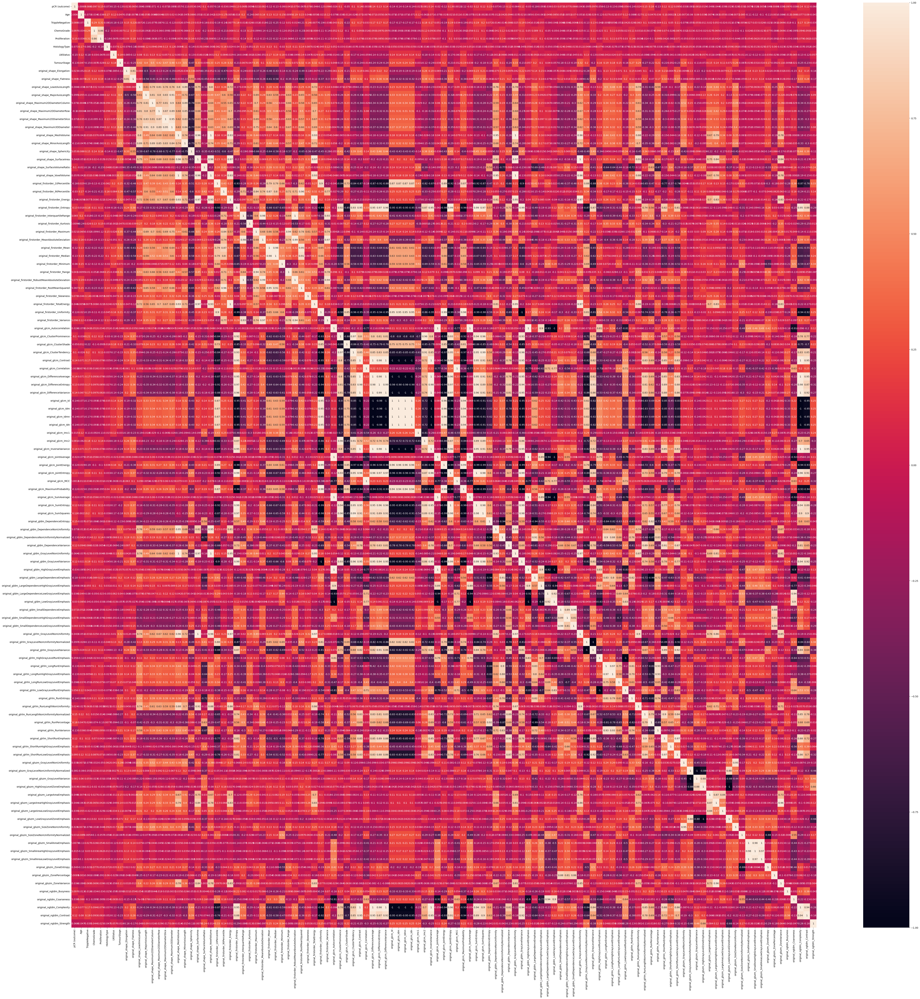

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


plt.figure(figsize=(70,70))
sns.heatmap(correlation, annot=True)

From the correlation mapping of the whole dataset it's clear that the majority of the variables listed do not share a strong positive correlation with the RFS outcome.

In looking into this evidence I have listed some features that have the best correlation associated with the outcome.

My method is to reduce the dataset currently listed into the best features as described into a new dataset.

After cleaning and handling missing data we will use FS and DR techniques to combine said features together to have a better coverage over the variance of all data.

## Pairplot

## Feature Selection (preliminary)

In [24]:
# Locate the best features that affect the outcome the most
# Locate the best 10 features to select (k=10) using chi2 distribution
# For regression tasks we will use f_regression


# Find a way to list all the features that have the best correlation with said outcome (using the filter method)
#corlist = abs(X.corr()["RelapseFreeSurvival (outcome)"].sort_values(ascending=False))
#corlist

# Find all the features that have a correlation greater than 10% but less than 90%
#col_names = corlist[corlist.gt(0.10) & corlist.lt(0.9)].index
#col_names


from sklearn.datasets import load_digits
from sklearn.feature_selection import SelectKBest, f_regression

X_fs = SelectKBest(score_func=f_regression, k=10).fit_transform(X, y)

In [25]:
# Convert back to DataFrame for readability
X_fs = pd.DataFrame(data=X_fs)
X_fs.columns = ['FS' + str(col+1) for col in X_fs.columns.values]

In [26]:
X_fs

,FS1,FS2,FS3,FS4,FS5,FS6,FS7,FS8,FS9,FS10
0,2.0,32.844370,38.626416,39.572718,0.771675,0.708860,0.406537,0.278008,3.366632,0.174026
1,2.0,43.504095,41.761226,53.310412,0.603481,2.322627,0.730463,0.499454,4.964442,0.318599
2,2.0,36.435505,40.447497,44.384682,0.608183,1.961740,0.509910,0.400199,4.867321,0.231278
3,3.0,53.050724,44.944410,69.000000,0.474509,2.164869,0.740609,0.442713,3.881506,0.309734
4,2.0,27.265716,30.594117,35.042831,0.756228,1.832410,0.787978,0.447799,3.181566,0.324996
...,...,...,...,...,...,...,...,...,...,...
385,4.0,64.594244,62.649820,78.549348,0.310172,2.963478,1.258053,0.729110,6.258416,0.515416
386,2.0,18.813092,16.643317,24.535688,0.670158,2.978465,1.459563,0.753829,3.990703,0.585934
387,3.0,37.616059,43.657760,45.836667,0.758747,1.982108,0.869352,0.554049,4.884933,0.369673
388,2.0,36.872027,28.792360,39.874804,0.491660,2.866991,1.248523,0.694582,4.566028,0.512193


# Train and Test split (preliminary)

In [27]:
# After condensing the data to 20 featuers we will try a prelimary round 
# I will use linear regression to find the overall accuracy of the model this time
# Splitting the data (70/30 training/test split)

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

X_train, X_test, y_train, y_test = train_test_split(X_fs, y, test_size=0.3, random_state=42)

### Standardize the numeric values

In [28]:
# Convert data to small values with mean of 0 and standard deviation of 1
#Scaling numeric features using sklearn StandardScalar
# Exluding FS1
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer


numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])
sc = StandardScaler()

#X_train = sc.fit_transform(X_train[X_train.columns[~X_train.columns.isin(['FS1'])]])
#X_test = sc.fit_transform(X_test[X_test.columns[~X_test.columns.isin(['FS1'])]])

In [29]:
numeric_features = X_fs.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X_fs.select_dtypes(include=['object']).columns

from sklearn.compose import ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

## Use linear regression to predict outcome

In [65]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

lr = Pipeline(steps=[('preprocessor', preprocessor),
                      ('regressor', LinearRegression())])



#Create a LinearRegression object
#lr= LinearRegression()
#Fit X and y 
lr.fit(X_train, y_train)
ypred = lr.predict(X_test)
#Metrics to evaluate your model 
r2_score(y_test, ypred), mean_absolute_error(y_test, ypred), np.sqrt(mean_squared_error(y_test, ypred))
X_train

,FS1,FS2,FS3,FS4,FS5,FS6,FS7,FS8,FS9,FS10
163,2.0,40.624852,44.102154,45.497253,0.618498,2.254312,1.165495,0.694021,5.305013,0.492704
24,2.0,36.462493,43.046487,43.485630,0.610466,2.222229,1.268135,0.711753,4.953032,0.520559
175,2.0,27.589863,24.351591,31.780497,0.712014,2.353438,1.536684,0.793796,4.572264,0.615798
341,1.0,21.334149,25.709920,25.787594,0.877883,1.829146,1.004687,0.568109,3.916575,0.412347
145,4.0,102.590920,100.647901,128.148351,0.251512,3.178780,1.426704,0.845068,7.276189,0.598116
...,...,...,...,...,...,...,...,...,...,...
71,2.0,42.622334,50.566788,56.338264,0.606587,2.345913,1.095044,0.611505,4.451030,0.450701
106,2.0,28.395779,37.336309,39.064050,0.586654,0.550056,0.176432,0.472739,4.002886,0.195550
270,2.0,32.773770,33.526109,38.131352,0.519002,2.429951,1.220753,0.668613,4.361237,0.502925
348,3.0,78.213801,60.406953,104.014422,0.402817,3.957380,1.872993,1.021093,6.689262,0.759477


# Decision tree regressor to predict outcome

In [31]:
from sklearn.tree import DecisionTreeRegressor
#create decision tree
dt = DecisionTreeRegressor(max_depth=5).fit(X_train, y_train)

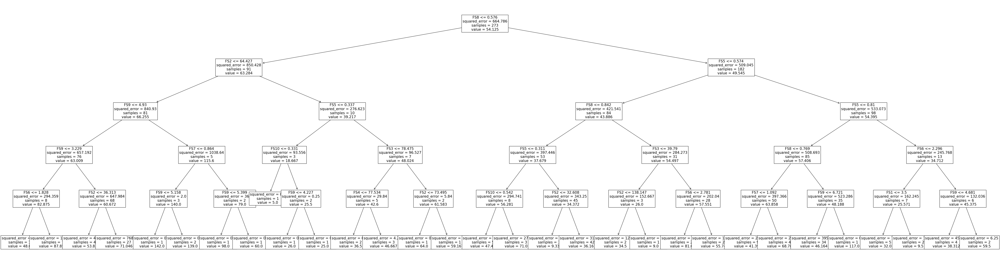

In [32]:
from sklearn import tree

#visualise decision tree
plt.figure(figsize=(75,20))  
_ = tree.plot_tree(dt, feature_names = X_fs.columns, fontsize=15)
plt.show()

In [33]:
ypred = dt.predict(X_test)

In [34]:
r2_score(y_test, ypred), mean_absolute_error(y_test, ypred), np.sqrt(mean_squared_error(y_test, ypred))

(-0.4264644287448065, 26.675682249947688, 33.944134673487675)

In [35]:
best_depth = 1
best_mse = 100000000000

for i in range(3, 50):
    dt = DecisionTreeRegressor(max_depth=i).fit(X_train, y_train)
    ypred = dt.predict(X_test)
    score = mean_absolute_error(y_test, ypred)
    if score < best_mse:
        best_mse = score
        best_depth = i
        
print("best depth: {}\nbest mse: {}".format(best_depth, best_mse))


best depth: 3
best mse: 25.15370545739627


## Trying with other methods and testing the accuracy of each model

In [36]:
# Try other regression methods

from sklearn.metrics import accuracy_score, log_loss, mean_absolute_error, mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
# Cross validation score and KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

# Using cross validation with 5 folds
cv = KFold(n_splits=5, random_state=None, shuffle=False)

regressors = [
    KNeighborsRegressor(3),
    SVR(kernel="rbf", C=0.025),
    NuSVR(),
    DecisionTreeRegressor(),
    RandomForestRegressor(),
    AdaBoostRegressor(),
    GradientBoostingRegressor()
    ]
for regressor in regressors:
    pipe = Pipeline(steps=[('preprocessor', preprocessor),
                      ('regression', regressor)])
    model = pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)
    print(regressor)
    score_cv = cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error',cv=cv, n_jobs=-1)
    print('Cross validation score across {}-folds are: {}'.format(cv.get_n_splits(), score_cv))
    print("Model Mean Absolute Error: %.2f" % mean_absolute_error(y_test, y_pred))

KNeighborsRegressor(n_neighbors=3)
Cross validation score across 5-folds are: [ -847.02666945  -641.04692761  -842.52212403 -1000.06508629
  -745.02843507]
Model Mean Absolute Error: 26.53
SVR(C=0.025)
Cross validation score across 5-folds are: [-622.01998196 -608.27974964 -678.81205176 -873.78210414 -562.62870587]
Model Mean Absolute Error: 23.12
NuSVR()
Cross validation score across 5-folds are: [-592.07109015 -561.57286209 -629.92912116 -845.83699194 -566.36174304]
Model Mean Absolute Error: 23.20
DecisionTreeRegressor()
Cross validation score across 5-folds are: [-1268.81666666 -1103.1155303  -1279.10037877 -1401.84439299
 -1518.26080246]
Model Mean Absolute Error: 29.13
RandomForestRegressor()
Cross validation score across 5-folds are: [-647.20659007 -558.83301277 -658.54815124 -875.60229446 -653.53562249]
Model Mean Absolute Error: 24.27
AdaBoostRegressor()
Cross validation score across 5-folds are: [-682.77446579 -532.29045239 -747.98295374 -786.50063246 -689.85117314]
Model Mea

## Feature Selection (secondary)

### PCA

In [37]:
# Import libraries for PCA analysis
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# libraries for data visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [38]:
# standardize the data
X_standard = StandardScaler().fit_transform(X_fs)

In [39]:
# Perform PCA (w/o limits on n_components)

# Collect all column names and insert into array
col_name = ['x' + str(idx) for idx in range(0, X_standard.shape[1])]
pca = PCA()
_ = pca.fit_transform(X_standard)
PC_components = np.arange(pca.n_components_) + 1

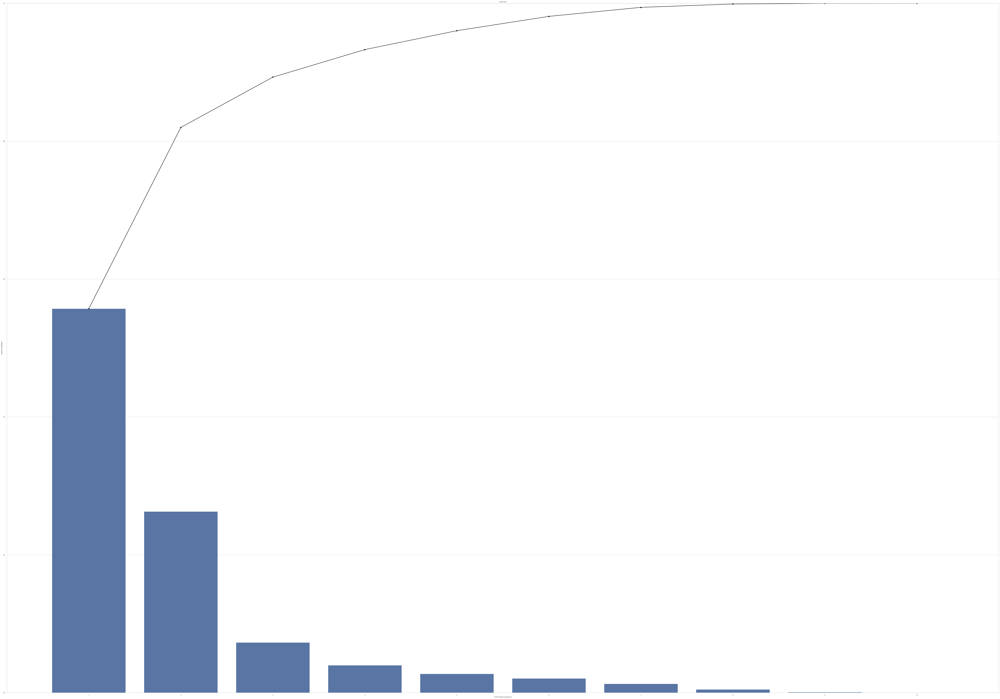

In [40]:
# Visualise proportion of the variance with a Scree Plot

_ = sns.set(style='whitegrid', font_scale=0.7)
fig, ax = plt.subplots(figsize=(100, 70))
_ = sns.barplot(x=PC_components, y=pca.explained_variance_ratio_, color='b')
_ = sns.lineplot(x=PC_components-1, y=np.cumsum(pca.explained_variance_ratio_), color='black', linestyle='-', linewidth=2, marker='o', markersize=8)

plt.title('Scree Plot')
plt.xlabel('N-th Principal Component')
plt.ylabel('Variance Explained')
plt.ylim(0, 1)
plt.show()

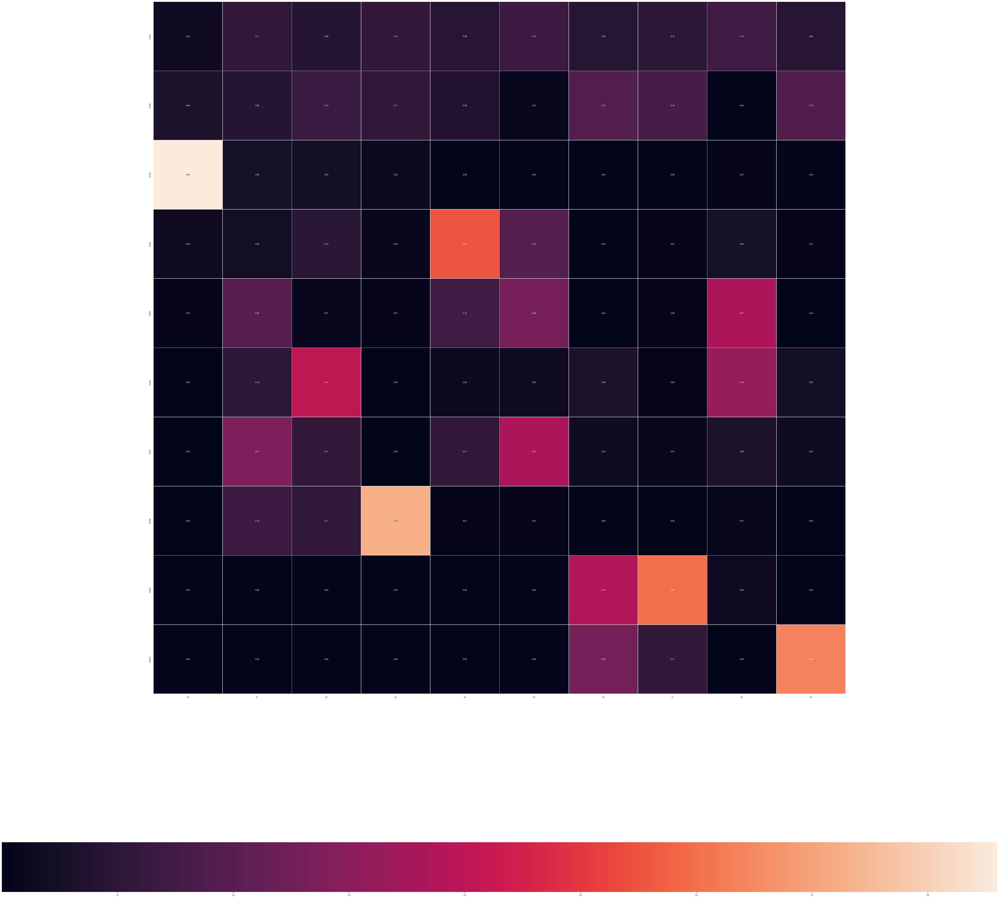

In [41]:
'''
Looks as if 20 components are the best 
It captures 90+% of the variance 
Now we should look that the combination of variables that created each principle component 
Showcased as a heatmap
'''
fig, ax = plt.subplots(figsize=(70,70))

_ = sns.heatmap(pca.components_**2,
                 yticklabels=["PCA"+str(x) for x in range(1,pca.n_components_+1)],
                 xticklabels=list(col_name),
                 annot=True,
                 fmt='.2f',
                 square=True,
                 linewidths=0.5,
                 cbar_kws={"orientation": "horizontal"},
               ax = ax)

In [42]:
'''
In this heatmap we can see the relationship between the PCA's and the features 
PCA1 is dominated by variable x101 (87%)
PCA2 is dominated by variables x100 and x102
PCA3 is mainly dominated by variable x111 (90%)

From this evidence we can conclude that 2 or 3 components are the most sufficient
'''

# Perform PCA again but with sufficient number of components

pca2 = PCA(n_components=0.9)
pca2_array = pca2.fit_transform(X_standard)

# Convert back to DataFrame for readability
df_pca = pd.DataFrame(data=pca2_array)
df_pca.columns = ['PC' + str(col+1) for col in df_pca.columns.values]


df_pca.head()

,PC1,PC2,PC3,PC4
0,-4.003345,1.903358,0.542324,0.829063
1,-1.334937,1.070988,0.679741,-0.280418
2,-2.199934,1.561079,0.623340,-0.264397
3,-1.033359,2.049397,-0.284103,-0.572387
4,-2.862503,0.479824,0.303910,0.084692


In [43]:
# locate the most important features
pca2.explained_variance_ratio_

array([0.55711612, 0.26284894, 0.07297116, 0.0399846 ])

In [44]:
pca2.explained_variance_

array([5.58548299, 2.63524641, 0.73158751, 0.40087387])

In [45]:
# Perform PCA with 90% of variance

pca = PCA(n_components=0.90)
pca_array = pca.fit_transform(X_fs)

# Convert back to dataframe for readability

df_pca = pd.DataFrame(data=pca_array)
df_pca.columns = ['PC' + str(col+1) for col in df_pca.columns.values]

df_pca.head()

df_pca['outcome'] = y

In [46]:
# Remove nan cases
df_pca.dropna()

,PC1,outcome
0,-22.120549,144.000000
1,-5.494826,142.000000
2,-15.996856,135.000000
3,11.677580,12.000000
4,-32.279658,109.000000
...,...,...
384,-33.576922,56.083333
385,33.428643,55.666667
386,-50.856162,55.083333
388,-24.398195,54.916667


# Data visualisation (after PCA)

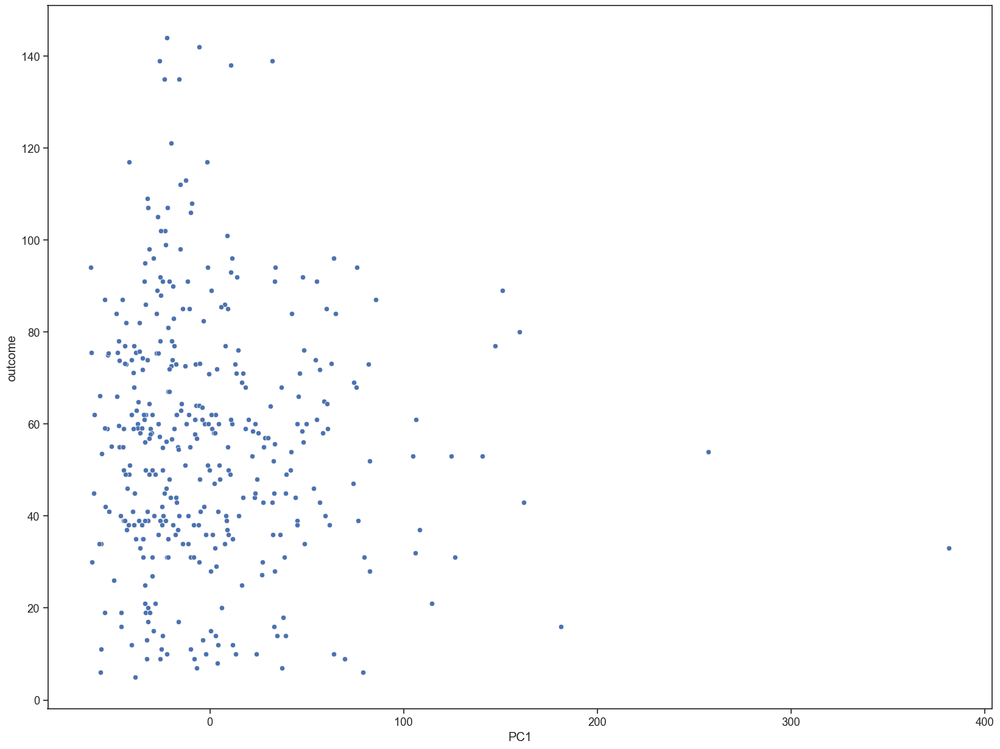

In [47]:
# Plot the graph

_ = sns.set(style='ticks', font_scale=1.2)
fig, ax = plt.subplots(figsize=(20, 15))
_ = sns.scatterplot(data=df_pca, x='PC1', y='outcome')

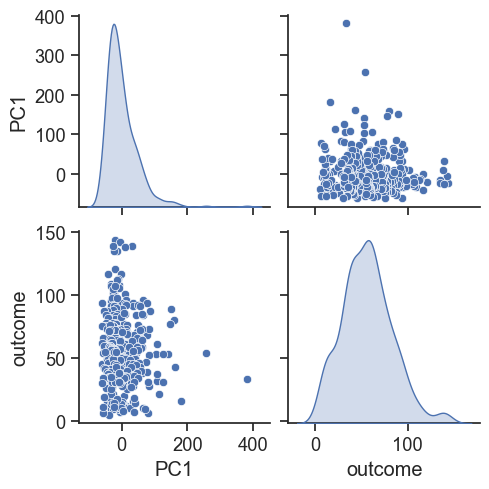

In [48]:
sns.pairplot(data=df_pca, diag_kind='kde')

# Other PCA method

In [49]:
X = X.to_numpy()
y = y.to_numpy()

from sklearn.decomposition import PCA

pca = PCA(n_components=2, svd_solver='full')
pca.fit(X)
PCA(n_components=2)

print(pca.explained_variance_ratio_)

[0.94311642 0.05605966]


In [50]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

In [51]:
#X = X.drop("pCR (outcome)", axis = 1)
X

array([[1.0000000e+00, 4.1000000e+01, 1.0000000e+00, ..., 1.8261499e-01,
        3.0507685e-02, 7.5779900e-04],
       [0.0000000e+00, 3.9000000e+01, 0.0000000e+00, ..., 3.2012453e-02,
        1.0057220e-03, 3.6849830e-03],
       [1.0000000e+00, 3.1000000e+01, 1.0000000e+00, ..., 2.4061822e-02,
        5.2944800e-04, 6.4471810e-03],
       ...,
       [0.0000000e+00, 6.9000000e+01, 0.0000000e+00, ..., 5.4062718e-02,
        3.6966650e-03, 1.3679770e-03],
       [0.0000000e+00, 4.6000000e+01, 0.0000000e+00, ..., 1.8681596e-02,
        3.1105600e-04, 2.2676177e-02],
       [1.0000000e+00, 5.5000000e+01, 0.0000000e+00, ..., 5.5150839e-02,
        3.0537260e-03, 3.4245200e-03]])

In [52]:
# Scale the features
scaler = StandardScaler()
X_features = scaler.fit_transform(X)
X_features

array([[ 1.77452421, -1.00103439,  1.42241197, ...,  2.64674721,
         2.89669829, -0.24830429],
       [-0.56353134, -1.18479688, -0.7030312 , ..., -0.52123516,
        -0.58837549, -0.22332679],
       [ 1.77452421, -1.91984685,  1.42241197, ..., -0.68847975,
        -0.64463785, -0.19975711],
       ...,
       [-0.56353134,  1.57164049, -0.7030312 , ..., -0.05739935,
        -0.27049377, -0.24309767],
       [-0.56353134, -0.54162816, -0.7030312 , ..., -0.80165487,
        -0.67043655, -0.06127599],
       [ 1.77452421,  0.28530305, -0.7030312 , ..., -0.0345103 ,
        -0.3464443 , -0.22554931]])

In [53]:
X_features[:,10:].shape
X_features_regression = X_features[:,10:] 
X_features_regression.shape

(390, 105)

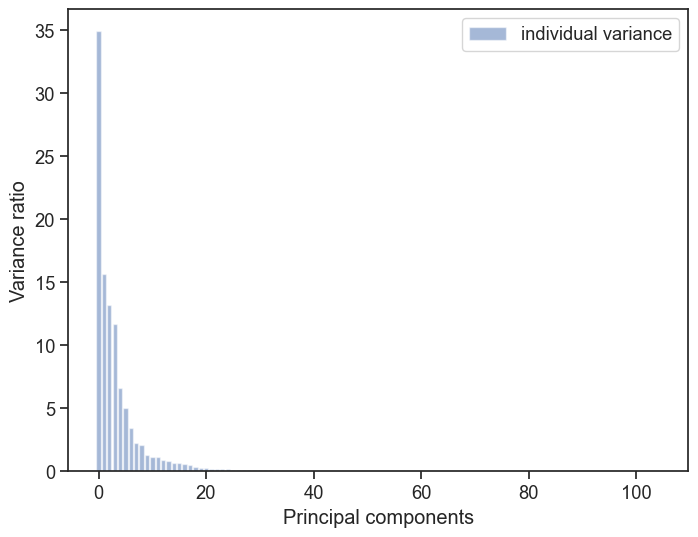

In [54]:
# Visualize
pca = PCA()
pca.fit_transform(X_features_regression)
pca_variance = pca.explained_variance_

plt.figure(figsize=(8, 6))
plt.bar(range(105), pca_variance, alpha=0.5, align='center', label='individual variance')
plt.legend()
plt.ylabel('Variance ratio')
plt.xlabel('Principal components')
plt.show()

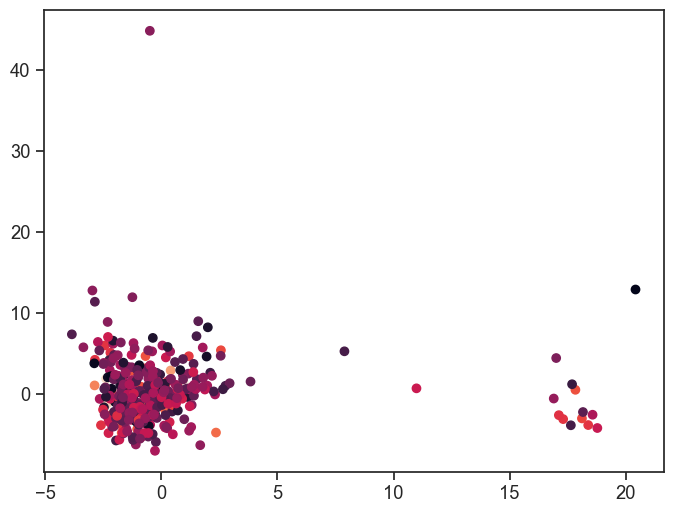

(390, 9)

In [55]:
pca2 = PCA(n_components=0.9)
pca2.fit(X_features_regression)
x_3d = pca2.transform(X_features_regression)

plt.figure(figsize=(8,6))
plt.scatter(x_3d[:,2], x_3d[:,1], c=y)
#plt.scatter(x_3d[:,0], x_3d[:,5], c=df['Age'])
plt.show()

x_3d.shape

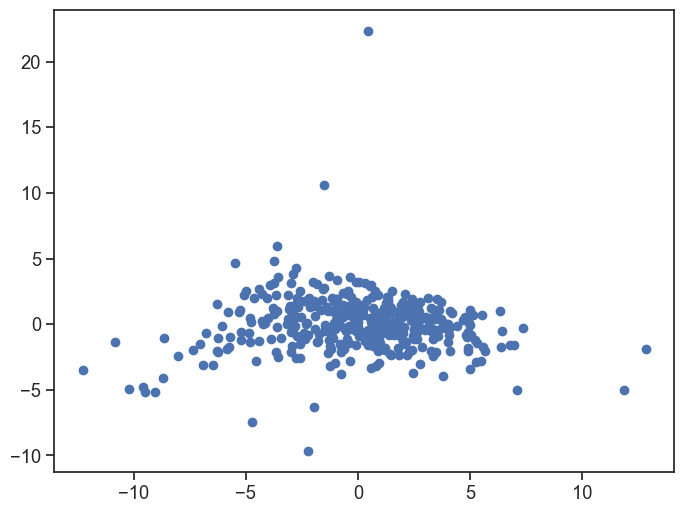

In [56]:
plt.figure(figsize=(8,6))
#plt.scatter(x_3d[:,2], x_3d[:,1], c=df['RelapseFreeSurvival (outcome)'])
#plt.scatter(x_3d[:,0], x_3d[:,5], c=df['Age'])
plt.scatter(x_3d[:,3], x_3d[:,5])
plt.show()

In [57]:
x_3d = x_3d[:,0:3] #retain the first 3 PC
x_3d.shape

(390, 3)

# ANN 

In [58]:
from tensorflow import keras
# create the model
# regression so using ReLU

model=keras.models.Sequential()
model.add(keras.layers.Dense(10, input_dim=10,activation="relu"))
model.add(keras.layers.Dense(20,activation="relu"))
model.add(keras.layers.Dense(1,activation='relu'))
model.summary()

2022-12-13 11:55:35.939612: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                110       
                                                                 
 dense_1 (Dense)             (None, 20)                220       
                                                                 
 dense_2 (Dense)             (None, 1)                 21        
                                                                 
Total params: 351
Trainable params: 351
Non-trainable params: 0
_________________________________________________________________


2022-12-13 11:55:38.972847: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [59]:
model.compile(loss="mse", optimizer="sgd", metrics=["accuracy", "MSE"])
#model.compile(loss="mse", optimizer=tf.keras.optimizers.Adam(0.001), metrics=["accuracy"])
#model.compile(loss="mean_absolute_error", optimizer="sgd", metrics=["accuracy"])
# save the initial weight for initilise new models in cross validation
model.save_weights('model.h5')

In [60]:
X_train

,FS1,FS2,FS3,FS4,FS5,FS6,FS7,FS8,FS9,FS10
163,2.0,40.624852,44.102154,45.497253,0.618498,2.254312,1.165495,0.694021,5.305013,0.492704
24,2.0,36.462493,43.046487,43.485630,0.610466,2.222229,1.268135,0.711753,4.953032,0.520559
175,2.0,27.589863,24.351591,31.780497,0.712014,2.353438,1.536684,0.793796,4.572264,0.615798
341,1.0,21.334149,25.709920,25.787594,0.877883,1.829146,1.004687,0.568109,3.916575,0.412347
145,4.0,102.590920,100.647901,128.148351,0.251512,3.178780,1.426704,0.845068,7.276189,0.598116
...,...,...,...,...,...,...,...,...,...,...
71,2.0,42.622334,50.566788,56.338264,0.606587,2.345913,1.095044,0.611505,4.451030,0.450701
106,2.0,28.395779,37.336309,39.064050,0.586654,0.550056,0.176432,0.472739,4.002886,0.195550
270,2.0,32.773770,33.526109,38.131352,0.519002,2.429951,1.220753,0.668613,4.361237,0.502925
348,3.0,78.213801,60.406953,104.014422,0.402817,3.957380,1.872993,1.021093,6.689262,0.759477


In [61]:
#start training using feature selected features
# Tensorflow/Keras uses np array, so need to convert the data format
# make sure the weights are initialised
model.load_weights('model.h5')
# Model learning
history= model.fit(np.array(X_train), np.array(y_train), epochs=50, validation_data=(np.array(X_test), np.array(y_test)))

Epoch 1/50
9/9 [==============================] - 1s 14ms/step - loss: 15813543450378240.0000 - accuracy: 0.0000e+00 - MSE: 15813543450378240.0000 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 2/50
9/9 [==============================] - 0s 3ms/step - loss: 3594.2524 - accuracy: 0.0000e+00 - MSE: 3594.2524 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 3/50
9/9 [==============================] - 0s 3ms/step - loss: 3594.2527 - accuracy: 0.0000e+00 - MSE: 3594.2527 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 4/50
9/9 [==============================] - 0s 3ms/step - loss: 3594.2524 - accuracy: 0.0000e+00 - MSE: 3594.2524 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 5/50
9/9 [==============================] - 0s 3ms/step - loss: 3594.2524 - accuracy: 0.0000e+00 - MSE: 3594.2524 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 6/50
9/9 [=======

Epoch 44/50
9/9 [==============================] - 0s 3ms/step - loss: 3594.2524 - accuracy: 0.0000e+00 - MSE: 3594.2524 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 45/50
9/9 [==============================] - 0s 3ms/step - loss: 3594.2524 - accuracy: 0.0000e+00 - MSE: 3594.2524 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 46/50
9/9 [==============================] - 0s 3ms/step - loss: 3594.2522 - accuracy: 0.0000e+00 - MSE: 3594.2522 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 47/50
9/9 [==============================] - 0s 3ms/step - loss: 3594.2527 - accuracy: 0.0000e+00 - MSE: 3594.2527 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 48/50
9/9 [==============================] - 0s 3ms/step - loss: 3594.2522 - accuracy: 0.0000e+00 - MSE: 3594.2522 - val_loss: 4447.5015 - val_accuracy: 0.0000e+00 - val_MSE: 4447.5015
Epoch 49/50
9/9 [============================

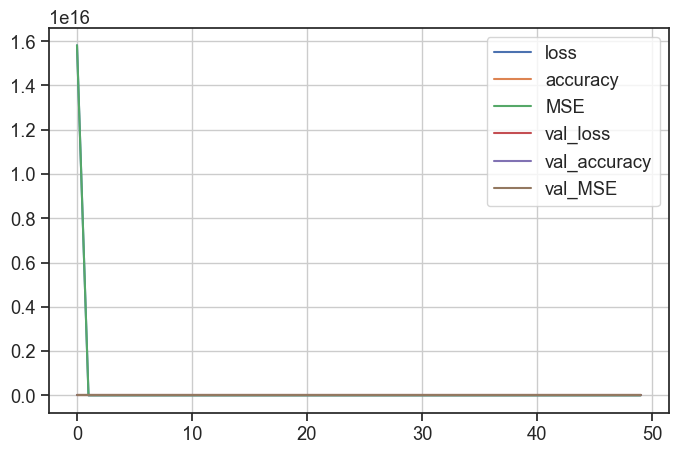

In [62]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
#plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

## Train-Vlad-Test Split

In [63]:
# After condensing the data to 20 featuers we will try a prelimary round 
# I will use linear regression to find the overall accuracy of the model this time
# Splitting the data (70/30 training/test split)

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

X_train, X_test, y_train, y_test = train_test_split(X_fs, y, test_size=0.3, random_state=42)

# Conclusion and Final Analysis

ANN has a mse that is very high, this will not be suitable

after all of the other methods for regression, decision tree, svm, etc all the mse values was simialar

overall the best methods was the linear regression